In [1]:
import pandas as pd
import numpy as np
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.model_selection import TimeSeriesSplit
from matplotlib import pyplot

In [2]:
df = pd.read_csv('train.csv') # считываем датасет
df.head() # смотрим на первые несколько строчек

C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3165: DtypeWarning: Columns (5) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


,id,date,store_nbr,item_nbr,unit_sales,onpromotion
0,0,2013-01-01,25,103665,7.0,NaN
1,1,2013-01-01,25,105574,1.0,NaN
2,2,2013-01-01,25,105575,2.0,NaN
3,3,2013-01-01,25,108079,1.0,NaN
4,4,2013-01-01,25,108701,1.0,NaN


In [3]:
# Возьмем для анализа один магазин
store_25 = df[df.store_nbr==25].groupby("date")['unit_sales'].sum().reset_index()

In [4]:
# приводим индексы к стандарту pd.Datetime, чтобы потом это можно было скормить seasonal_decompose
store_25 = store_25.set_index(pd.DatetimeIndex(store_25['date']))
 # замечаем, что т.к. у нас теперь есть индекс Month, нам больше не нужен столбец Month, который его дублирует
store_25.drop(['date'], axis = 1, inplace = True)
store_25.head() # смотрим на результат

,unit_sales
date,
2013-01-01,2511.619
2013-01-02,5316.224
2013-01-03,4442.913
2013-01-04,4844.354
2013-01-05,5817.526


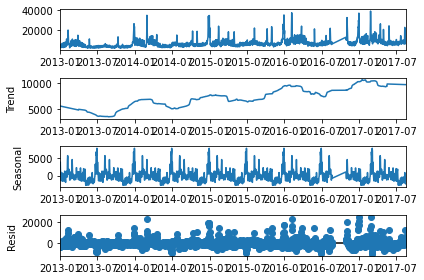

In [6]:
# применяем seasonal_decompose
# эта функция разложит ряд на трендовую, сезонную и шумовую составляющие
decomposition = seasonal_decompose(store_25, model='additive', extrapolate_trend='freq', period=182) 
decomposition.plot()
pyplot.show() # любуемся результатом

In [7]:
trend_part = decomposition.trend # отдельно трендовая составляющаяя
seasonal_part = decomposition.seasonal # отдельно сезонная составляющаяя
residual_part = decomposition.resid # отдельно шум: то, что осталось

In [8]:
# если мы хотим далее анализировать остатки, необходимо избавиться от некорректных значений если они есть
residual_part = residual_part.dropna()

In [9]:
residual_num = [x for x in residual_part if isinstance(x, (float, int))==True]
trend_num = [x for x in trend_part if isinstance(x, (float, int))==True]
print(f"Шумовая часть содержит всего {len(residual_part)} элементов\nИз них {len(residual_num)} числовых\n"
     f"Cезонная содержит всего {len(seasonal_part)} элементов\n"
     f"Трендовая содержит {len(trend_num)} числовых элементов")

Шумовая часть содержит всего 1618 элементов
Из них 1618 числовых
Cезонная содержит всего 1618 элементов
Трендовая содержит 1618 числовых элементов


In [10]:
# Выполним тест Дики-Фуллера
from statsmodels.tsa.stattools import adfuller

test = adfuller(store_25['unit_sales'])
print ('adf: ', test[0] )
print ('p-value: ', test[1])
print ('Critical values: ', test[4])
if test[0]> test[4]['5%']: # проверка, больше ли критического полученное значение для нашего ряда 
    print ('ряд не стационарен')
else:
    print ('ряд стационарен')

adf:  -4.8589926653181825
p-value:  4.188394192907736e-05
Critical values:  {'1%': -3.4344642432857992, '5%': -2.8633571955690647, '10%': -2.5677374399794197}
ряд стационарен


In [11]:
tscv = TimeSeriesSplit(n_splits=3)
train_test_groups = tscv.split(store_25['unit_sales'])
for train_index, test_index in train_test_groups:
    print("TRAIN:", len(train_index), "TEST:", len(test_index))

TRAIN: 406 TEST: 404
TRAIN: 810 TEST: 404
TRAIN: 1214 TEST: 404


In [12]:
tscv_2 = TimeSeriesSplit(n_splits=7)
train_test_groups = tscv_2.split(store_25['unit_sales'])
for train_index, test_index in train_test_groups:
    print("TRAIN:", len(train_index), "TEST:", len(test_index))

TRAIN: 204 TEST: 202
TRAIN: 406 TEST: 202
TRAIN: 608 TEST: 202
TRAIN: 810 TEST: 202
TRAIN: 1012 TEST: 202
TRAIN: 1214 TEST: 202
TRAIN: 1416 TEST: 202


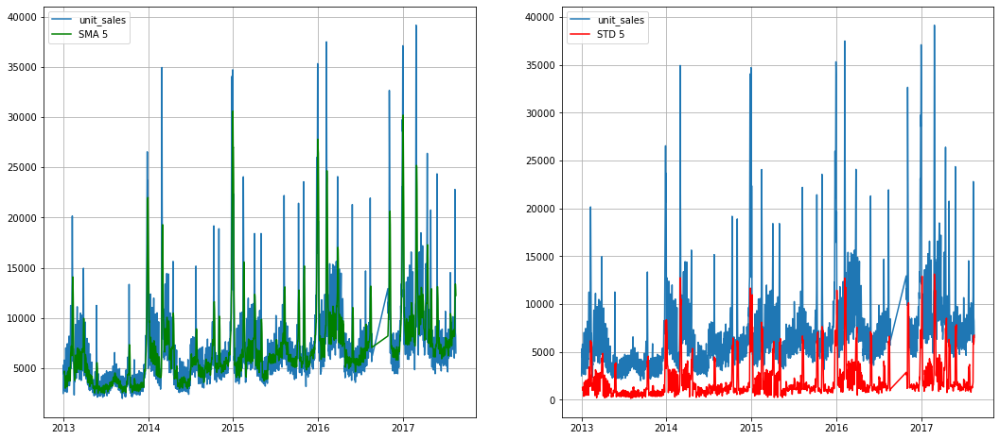

In [13]:
store_25 = df[df.store_nbr==25].groupby("date")['unit_sales'].sum().reset_index()
store_25['date'] = pd.to_datetime(store_25.date)
#Для наглядности графиков буду брать один год
#store_25 = store_25.iloc[-366:-1]
#store_25 = store_25.reset_index()

N = 5

## делаем оконное среднее с окном в N точек
store_25['rolling_mean_' + str(N)] = store_25.unit_sales.rolling(window=N).mean()
## скользящее квадратичное отклонение с окном в N точек
store_25['rolling_std_' + str(N)] = store_25.unit_sales.rolling(window=N).std()

## визуализируем
f, ax = pyplot.subplots(1, 2, figsize=(18, 8))
ax[0].plot(store_25.date, store_25.unit_sales) ## исходные данные
ax[0].plot(store_25.date, store_25['rolling_mean_' + str(N)],  c='g') ## оконное среднее
ax[0].legend(['unit_sales', 'SMA ' + str(N)])
ax[0].grid()

ax[1].plot(store_25.date, store_25.unit_sales) ## исходные данные
ax[1].plot(store_25.date, store_25['rolling_std_' + str(N)], c='r') ## оконное квадратичное отклонение
ax[1].legend(['unit_sales', 'STD ' + str(N)])
ax[1].grid()
pyplot.show()

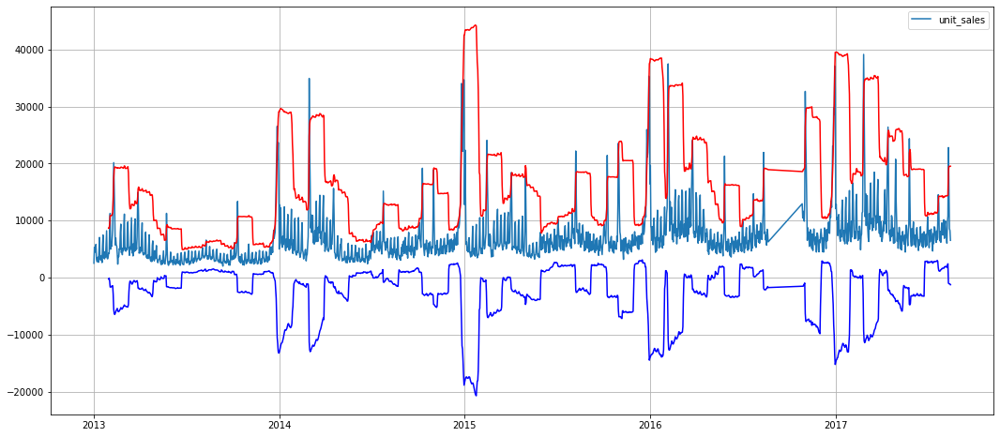

In [14]:
#Линии болинджера
N = 30

## делаем оконное среднее с окном в N точек
store_25['rolling_mean_' + str(N)] = store_25.unit_sales.rolling(window=N).mean()
## скользящее квадратичное отклонение с окном в N точек
store_25['rolling_std_' + str(N)] = store_25.unit_sales.rolling(window=N).std()
## экспоненциально среднее с окном в N точек
#store_25['rolling_ema_' + str(N)] = store_25.unit_sales.ewm(min_periods=N, span=N).mean()
upline = store_25['rolling_mean_' + str(N)] + store_25['rolling_std_' + str(N)] * 3
downline = store_25['rolling_mean_' + str(N)] - store_25['rolling_std_' + str(N)] * 3

## визуализируем
f, ax = pyplot.subplots(1, 1, figsize=(18, 8))
ax.plot(store_25.date, store_25.unit_sales) ## исходные данные
ax.plot(store_25.date, upline,  c='r') ## верхняя линия
ax.plot(store_25.date, downline,  c='b') ## нижняя линия

ax.legend(['unit_sales'])
ax.grid()

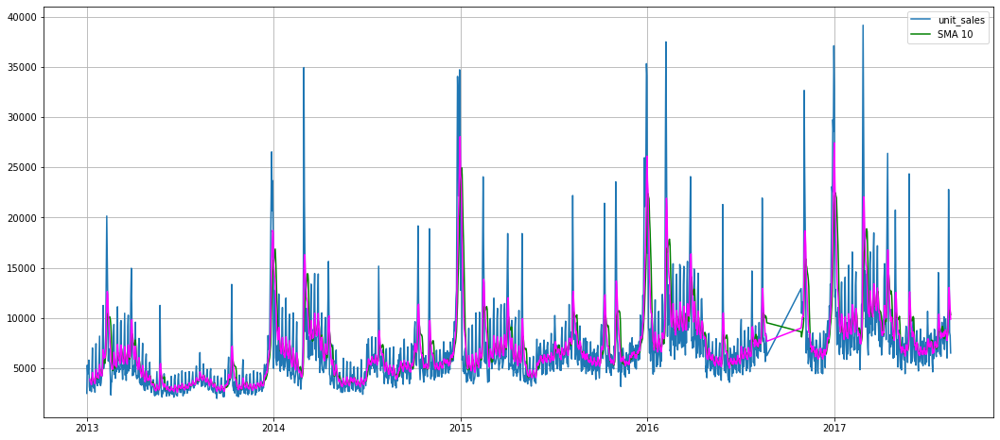

In [15]:
N = 10
W = 7

## делаем оконное среднее с окном в N точек
store_25['rolling_mean_' + str(N)] = store_25.unit_sales.rolling(window=N).mean()
## экспоненциально среднее с окном в W точек
store_25['rolling_ema_' + str(W)] = store_25.unit_sales.ewm(min_periods=W, span=W).mean()

## визуализируем
f, ax = pyplot.subplots(1, 1, figsize=(18, 8))
ax.plot(store_25.date, store_25.unit_sales) ## исходные данные
ax.plot(store_25.date, store_25['rolling_mean_' + str(N)],  c='g') ## оконное среднее
ax.plot(store_25.date, store_25['rolling_ema_'  + str(W)],  c='magenta') ## экспоненциально среднее
ax.legend(['unit_sales', 'SMA ' + str(N)])
ax.grid()

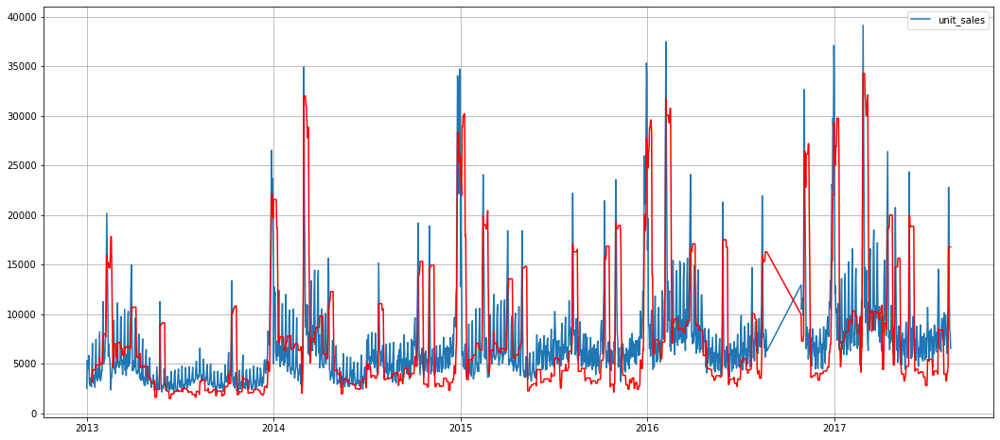

In [16]:
# среднее арифметическое между максимальным и минимальным значением unit_sales
N = 10

## делаем оконное среднее с окном в N точек
store_25['rolling_max_' + str(N)] = store_25.unit_sales.rolling(window=N).max()
## скользящее квадратичное отклонение с окном в N точек
store_25['rolling_min_' + str(N)] = store_25.unit_sales.rolling(window=N).min()
## экспоненциально среднее с окном в N точек
my_line = store_25['rolling_max_' + str(N)] - store_25['rolling_min_' + str(N)]

## визуализируем
f, ax = pyplot.subplots(1, 1, figsize=(18, 8))
ax.plot(store_25.date, store_25.unit_sales) ## исходные данные
ax.plot(store_25.date, my_line,  c='r') ## верхняя линия

ax.legend(['unit_sales'])
ax.grid()

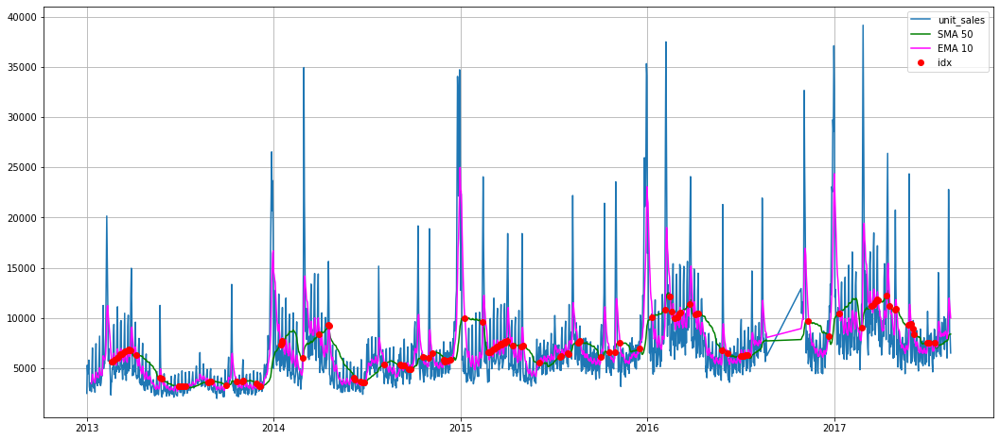

In [17]:
N = 50
W = 10

## делаем оконное среднее с окном в N точек
store_25['rolling_mean_' + str(N)] = store_25.unit_sales.rolling(window=N).mean()
## экспоненциально среднее с окном в W точек
store_25['rolling_ema_' + str(W)] = store_25.unit_sales.ewm(min_periods=W, span=W).mean()
#Разность значений

#продифференциируем разность скользящих средних и возьмем необходимые точки
dif = np.diff(np.sign(store_25['rolling_mean_' + str(N)]-store_25['rolling_ema_' + str(W)]))
idx = np.argwhere(dif).flatten()

## визуализируем
f, ax = pyplot.subplots(1, 1, figsize=(18, 8))
ax.plot(store_25.date, store_25.unit_sales) ## исходные данные
ax.plot(store_25.date, store_25['rolling_mean_' + str(N)],  c='g') ## оконное среднее
ax.plot(store_25.date, store_25['rolling_ema_'  + str(W)],  c='magenta') ## экспоненциально среднее
ax.plot(store_25.date[idx], store_25['rolling_mean_' + str(N)][idx], 'ro')
ax.legend(['unit_sales', 'SMA ' + str(N), 'EMA ' + str(W), 'idx'])
ax.grid()

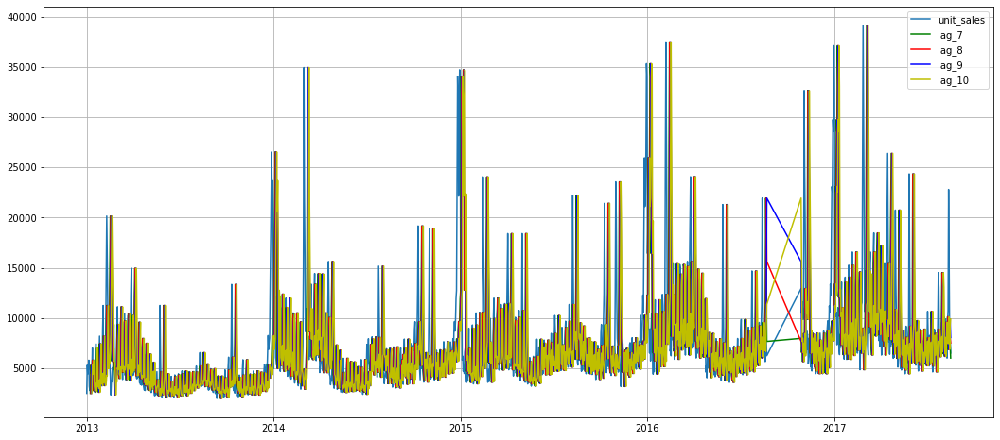

In [18]:
for i in range(7,11):
    store_25['lag_{}'.format(i)] = store_25.unit_sales.shift(i)


## визуализируем
f, ax = pyplot.subplots(1, 1, figsize=(18, 8))
ax.plot(store_25.date, store_25.unit_sales) ## исходные данные
ax.plot(store_25.date, store_25['lag_' + str(7)],  c='g') 
ax.plot(store_25.date, store_25['lag_' + str(8)],  c='r') 
ax.plot(store_25.date, store_25['lag_' + str(9)],  c='b') 
ax.plot(store_25.date, store_25['lag_' + str(10)],  c='y')  
ax.legend(['unit_sales', 'lag_7', 'lag_8', 'lag_9', 'lag_10'])
ax.grid()

#### ARIMA/SARIMA

In [19]:
import os
import matplotlib.pyplot as plt
%matplotlib inline

In [20]:
# Выберем необходимый продукт и преобразуем даты
train = pd.read_csv("train.csv")
top1 = train[train.item_nbr == 103501 ]
top1['date'] = pd.to_datetime(top1['date'])
top1['year'] = top1['date'].dt.year

C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3165: DtypeWarning: Columns (5) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
<ipython-input-20-e56cd279e475>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top1['date'] = pd.to_datetime(top1['date'])
<ipython-input-20-e56cd279e475>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top1['year'] = top1['date'].dt.year


In [21]:
# приведем данные к виду временного ряда с группировкой по дате и агрегацией .sum()['unit_sales']
unit_sales_by_date = top1.groupby('date').sum()['unit_sales']

In [22]:
# Импортируем метрики
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error

In [23]:
# Проведем тест Адфуллера для провери стационарности рядя
from statsmodels.tsa.stattools import adfuller

X = unit_sales_by_date.values
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

if result[0] < result[4]["5%"]:
    print ("Reject Ho - Time Series is Stationary")
else:
    print ("Failed to Reject Ho - Time Series is Non-Stationary")

ADF Statistic: -4.154403
p-value: 0.000786
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
Reject Ho - Time Series is Stationary


(1619,) (1625,)
mean_squared_error 1139.483889232036
mean_absolute_error 26.661828289067326
mean_absolute_percentage_error 0.326732641949257


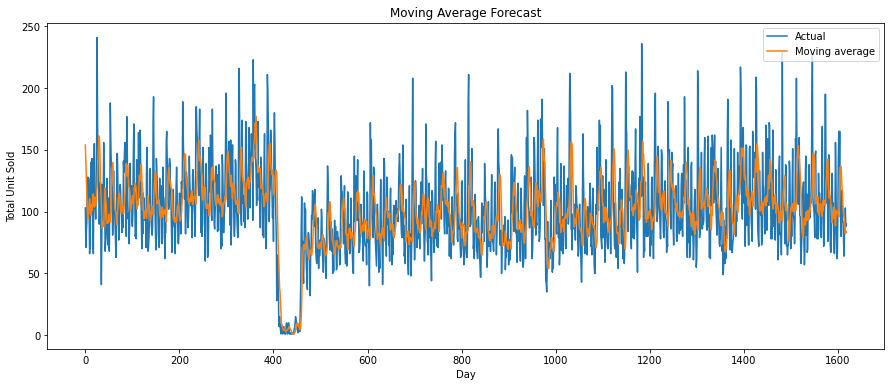

In [24]:
def moving_average_forecast(series, window_size):
    forecast = []
    for time in range(len(series) - window_size):
        forecast.append(series[time:time + window_size].mean())
    return np.array(forecast)
moving_average_days = 6
moving_avg = moving_average_forecast(unit_sales_by_date,moving_average_days )# 

print(moving_avg.shape,unit_sales_by_date.shape)

print("mean_squared_error",mean_squared_error(unit_sales_by_date.values[moving_average_days:], moving_avg))
print("mean_absolute_error",mean_absolute_error(unit_sales_by_date.values[moving_average_days:], moving_avg))
print("mean_absolute_percentage_error",mean_absolute_percentage_error(unit_sales_by_date.values[moving_average_days:], moving_avg))


plt.figure(figsize=(15,6))

plt.plot(unit_sales_by_date.values[moving_average_days:], label="Actual")
plt.plot(moving_avg, label="Moving average")
plt.ylabel("Total Unit Sold")
plt.xlabel("Day")
plt.title("Moving Average Forecast")
plt.legend(loc="upper right")

In [25]:
# Сделаем лаги с 1 по 6-ой
df = pd.DataFrame()

df["Original Values"]  = unit_sales_by_date
df["lag_1"] = df["Original Values"].shift()
df["lag_2"] = df["lag_1"].shift()
df["lag_3"] = df["lag_2"].shift()
df["lag_4"] = df["lag_3"].shift()
df["lag_5"] = df["lag_4"].shift()
df["lag_6"] = df["lag_5"].shift()


lag_value = 6
df.dropna(inplace=True)

In [26]:
df

,Original Values,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6
date,,,,,,,
2013-01-08,103.0,98.0,173.0,160.0,155.0,153.0,185.0
2013-01-09,71.0,103.0,98.0,173.0,160.0,155.0,153.0
2013-01-10,83.0,71.0,103.0,98.0,173.0,160.0,155.0
2013-01-11,91.0,83.0,71.0,103.0,98.0,173.0,160.0
2013-01-12,118.0,91.0,83.0,71.0,103.0,98.0,173.0
...,...,...,...,...,...,...,...
2017-08-11,80.0,64.0,81.0,92.0,92.0,115.0,117.0
2017-08-12,84.0,80.0,64.0,81.0,92.0,92.0,115.0
2017-08-13,103.0,84.0,80.0,64.0,81.0,92.0,92.0


In [27]:
# Разделим выборку на тренировочную и тестовую таким образом, чтобы в тест попадал весь 2017 год
x_train = unit_sales_by_date['2013':'2016'].values
x_test  = unit_sales_by_date['2017'].values

x_train, y_train = df['2013':'2016'].iloc[:,0:lag_value].values, df['2013':'2016'].iloc[:,lag_value:].values
x_test, y_test = df['2017'].iloc[:,0:lag_value].values, df['2017'].iloc[:,lag_value:].values

<ipython-input-27-de3ac3b208bb>:6: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  x_test, y_test = df['2017'].iloc[:,0:lag_value].values, df['2017'].iloc[:,lag_value:].values


[[ 0.31483972 -0.06093726 -0.00835441 -0.02690103 -0.05841532  0.65215135]]
[18.74834312]
mean_squared_error 913.1612631365098
mean_absolute_error 23.42463283045062
mean_absolute_percentage_error 0.21190002900141588


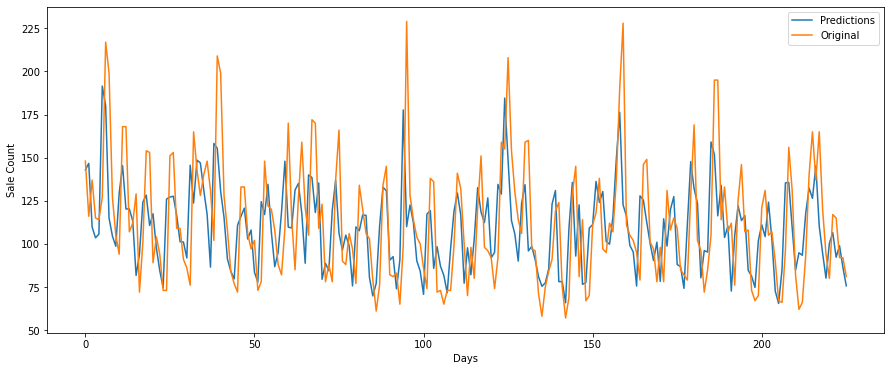

In [28]:
# Сделаем прогноз линейной регрессией, посчитаем значения метрик MSE, MAE, MAPE
from sklearn.linear_model import LinearRegression
reg = LinearRegression().fit(x_train, y_train)
print(reg.coef_)
print(reg.intercept_)


ar_predictions = reg.predict(x_test)

plt.figure(figsize=(15,6))
plt.plot(ar_predictions ,label = "Predictions")
plt.plot(y_test, label = "Original" )
plt.xlabel("Days")
plt.ylabel("Sale Count")

print("mean_squared_error",mean_squared_error(y_test, ar_predictions))
print("mean_absolute_error",mean_absolute_error(y_test, ar_predictions))
print("mean_absolute_percentage_error",mean_absolute_percentage_error(y_test, ar_predictions))


plt.legend(loc="upper right")

Итак, чтобы построить модель нам нужно знать ее порядок, состоящий из 3-х параметров:

p — порядок компоненты AR
d — порядок интегрированного ряда
q — порядок компонетны MA
d мы уже знаем - это 1

осталось определить p и q. Для их определения нам надо изучить авторкорреляционную(ACF) и частично автокорреляционную(PACF) функции для ряда первых разностей.

ACF поможет нам определить q, т. к. по ее коррелограмме можно определить количество автокорреляционных коэффициентов сильно отличных от 0 в модели MA PACF поможет нам определить p, т. к. по ее коррелограмме можно определить максимальный номер коэффициента сильно отличный от 0 в модели AR.

Чтобы построить соответствующие коррелограммы, в пакете statsmodels имеются следующие функции: plot_acf() и plot_pacf(). Они выводят графики ACF и PACF, у которых по оси X откладываются номера лагов, а по оси Y значения соответствующих функций. Нужно отметить, что количество лагов в функциях и определяет число значимых коэффициентов.

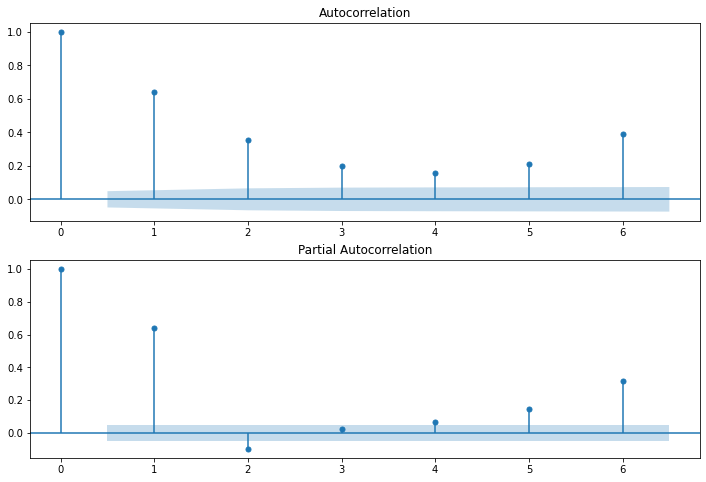

In [29]:
# Определим p и q для моделей ARMA и ARIMA
import statsmodels.api as sm
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(unit_sales_by_date.values.squeeze(), lags=6, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(unit_sales_by_date, lags=6, ax=ax2)

Из коррелограмм выше мы видим что p=6 и q=6

<ipython-input-30-95c9a8fe36ce>:7: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  x_test, y_test = df['2017'].iloc[:,0:lag_value], df['2017'].iloc[:,lag_value:]
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)

mean_squared_error 3255.8089040384693
mean_absolute_error 47.09762846499531
mean_absolute_percentage_error 0.4688684146001317


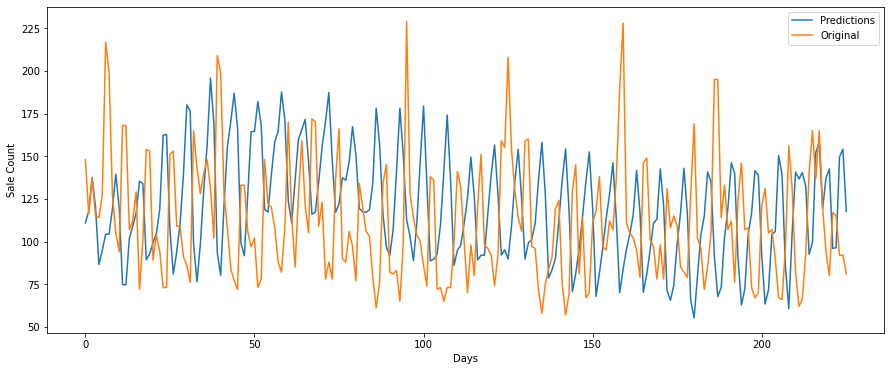

In [30]:
# ARMA модель
import statsmodels.api as sm
from statsmodels.tsa.arima_model import ARMA
from datetime import datetime, timedelta

x_train, y_train = df['2013':'2016'].iloc[:,0:lag_value], df['2013':'2016'].iloc[:,lag_value:]
x_test, y_test = df['2017'].iloc[:,0:lag_value], df['2017'].iloc[:,lag_value:]

ARMA_model = ARMA(x_train.values.reshape(-1).tolist(), (6,6)).fit()
arma_predictions = ARMA_model.predict(start=len(x_train), end=len(x_train) + len(x_test)-1, dynamic=False)


plt.figure(figsize=(15,6))
plt.plot(arma_predictions ,label = "Predictions")
plt.plot(y_test.values, label = "Original" )
plt.xlabel("Days")
plt.ylabel("Sale Count")
plt.legend(loc="upper right")

print("mean_squared_error",mean_squared_error(y_test, arma_predictions))
print("mean_absolute_error",mean_absolute_error(y_test, arma_predictions))
print("mean_absolute_percentage_error",mean_absolute_percentage_error(y_test, arma_predictions))

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.AR

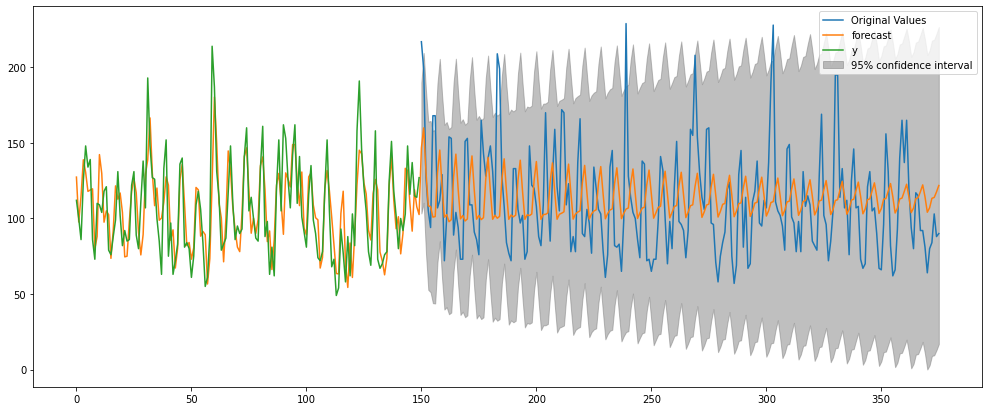

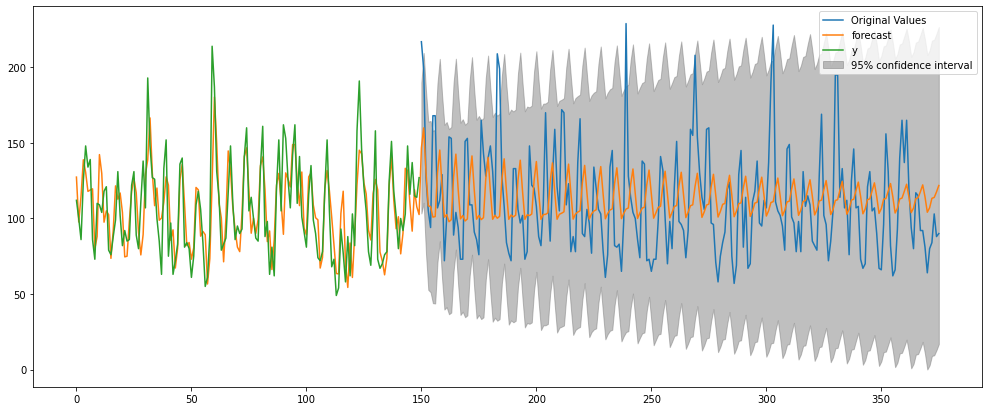

In [31]:
# ARIMA модель
from statsmodels.tsa.arima_model import ARIMA

model = ARIMA(x_train['Original Values'].values, (6,1,6)).fit()

fig, ax = plt.subplots(figsize=(17,7))
shown_train_size = 150
train_size = len(x_train['Original Values'].values)
test_size = len(x_test['Original Values'].values) 
ax = x_test.set_index(pd.Series(range(shown_train_size, shown_train_size + test_size)))['Original Values'].plot(ax=ax)
model.plot_predict(start=train_size-shown_train_size,end=train_size+test_size -1,dynamic=False, plot_insample=True,ax=ax)

In [32]:
arima_predictions = model.predict(train_size, train_size + test_size -1)
print("mean_squared_error",mean_squared_error(y_test, arima_predictions))
print("mean_absolute_error",mean_absolute_error(y_test, arima_predictions))
print("mean_absolute_percentage_error",mean_absolute_percentage_error(y_test, arima_predictions))

mean_squared_error 13669.333067217085
mean_absolute_error 112.17344799658278
mean_absolute_percentage_error 1.011554966368329


Обучив модели ARMA и ARIMA на представленном временном ряде видно, что модель ARMA лучше справилась с задачей MAPE=0.47 
к MAPE=1.01 у ARIMA. Это объясняется тем, что ARMA лучше подходит для стационарного временного ряда.

##### Fbprophet

In [1]:
import numpy as np
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
import pandas as pd
pd.set_option('display.max_rows', 10)
pd.set_option('display.max_columns', 70)
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode()

from fbprophet import Prophet

%time df_transactions = pd.read_csv('data/transactions.csv')
%time df_holidays_events = pd.read_csv('data/holidays_events.csv')

print('Data and libraries are loaded.')

Wall time: 41 ms
Wall time: 8 ms
Data and libraries are loaded.


In [3]:
df = pd.read_csv('train.csv') # считываем датасет
sales = df.groupby("date")['unit_sales'].sum().reset_index()
sales.head()

,date,unit_sales
0,2013-01-01,2511.619
1,2013-01-02,496092.418
2,2013-01-03,361429.231
3,2013-01-04,354459.677
4,2013-01-05,477350.121


In [4]:
py.iplot([go.Scatter(
    x=sales.date,
    y=sales.unit_sales
)])

In [5]:
sales.columns = ['ds', 'y']
sales

,ds,y
0,2013-01-01,2511.619
1,2013-01-02,496092.418
2,2013-01-03,361429.231
3,2013-01-04,354459.677
4,2013-01-05,477350.121
...,...,...
1679,2017-08-11,826373.722
1680,2017-08-12,792630.535
1681,2017-08-13,865639.677
1682,2017-08-14,760922.406


In [6]:
# выполним предсказание пророком (prophet) на год вперёд (periods=365)
m = Prophet()
m.fit(sales)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)
forecast

INFO:numexpr.utils:NumExpr defaulting to 8 threads.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-01-01,334051.734900,239858.947568,5.152520e+05,334051.734900,3.340517e+05,43512.534378,43512.534378,43512.534378,-68157.290939,-68157.290939,-68157.290939,111669.825316,111669.825316,111669.825316,0.0,0.0,0.0,3.775643e+05
1,2013-01-02,334428.558715,244850.263511,5.292433e+05,334428.558715,3.344286e+05,55547.430208,55547.430208,55547.430208,-44197.657491,-44197.657491,-44197.657491,99745.087699,99745.087699,99745.087699,0.0,0.0,0.0,3.899760e+05
2,2013-01-03,334805.382530,151903.552906,4.389498e+05,334805.382530,3.348054e+05,-44076.068708,-44076.068708,-44076.068708,-131876.949938,-131876.949938,-131876.949938,87800.881230,87800.881230,87800.881230,0.0,0.0,0.0,2.907293e+05
3,2013-01-04,335182.206345,212469.454990,4.943463e+05,335182.206345,3.351822e+05,18979.815624,18979.815624,18979.815624,-57035.600836,-57035.600836,-57035.600836,76015.416460,76015.416460,76015.416460,0.0,0.0,0.0,3.541620e+05
4,2013-01-05,335559.030160,388349.719770,6.692135e+05,335559.030160,3.355590e+05,198559.922942,198559.922942,198559.922942,134003.122248,134003.122248,134003.122248,64556.800694,64556.800694,64556.800694,0.0,0.0,0.0,5.341190e+05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2044,2018-08-11,990334.073294,903584.149062,1.189764e+06,944769.108637,1.033674e+06,63004.650000,63004.650000,63004.650000,134003.122248,134003.122248,134003.122248,-70998.472247,-70998.472247,-70998.472247,0.0,0.0,0.0,1.053339e+06
2045,2018-08-12,990597.061549,959926.885122,1.257085e+06,944864.123682,1.034076e+06,116920.249888,116920.249888,116920.249888,188404.142851,188404.142851,188404.142851,-71483.892963,-71483.892963,-71483.892963,0.0,0.0,0.0,1.107517e+06
2046,2018-08-13,990860.049803,749816.985194,1.047421e+06,944922.333868,1.034366e+06,-92448.329842,-92448.329842,-92448.329842,-21139.765895,-21139.765895,-21139.765895,-71308.563947,-71308.563947,-71308.563947,0.0,0.0,0.0,8.984117e+05
2047,2018-08-14,991123.038057,705047.938197,1.000464e+06,944887.649173,1.034656e+06,-138631.489615,-138631.489615,-138631.489615,-68157.290939,-68157.290939,-68157.290939,-70474.198676,-70474.198676,-70474.198676,0.0,0.0,0.0,8.524915e+05


In [7]:
py.iplot([
    go.Scatter(x=sales['ds'], y=sales['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])
# Вычислим среднеквадратичную ошибку.
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1684, 'yhat']-sales['y'])**2)) )

RMSE: 108278.510635


In [8]:
def prior_scale(data, changepoint):
    m = Prophet(changepoint_prior_scale=changepoint)
    m.fit(data)
    future = m.make_future_dataframe(periods=365)
    forecast = m.predict(future)
    return (np.sqrt(np.mean((forecast.loc[:1684, 'yhat']-data['y'])**2)))

In [9]:
changepoint = [0.2, 0.4, 1, 4, 7]
for x in changepoint:
    RMSE = prior_scale(sales, x)
    print ('RMSE: %f' % RMSE)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE: 100925.838374


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE: 98908.455701


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE: 97800.903215


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE: 97348.730463
RMSE: 97269.537701


Из полученных результатов видно что тренд недообучен, так как увеличение гибкости улучшает качество модели.

In [10]:
m = Prophet(changepoint_prior_scale=7)
m.fit(sales)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1684, 'yhat']-sales['y'])**2)))
py.iplot([
    go.Scatter(x=sales['ds'], y=sales['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE: 97269.537701


Теперь добавим в модель больше сезонности. Как мы видим, Пророк рассчитывает еженедельную и годовую сезонность. Нам не нужна ежедневная сезонность, потому что у нас нет внутридневных данных для этого случая. Достаточно просто добавить ежемесячную сезонность.

In [11]:
m = Prophet(changepoint_prior_scale=7)
m.add_seasonality(name='monthly', period=30.5, fourier_order=5)
m.fit(sales)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [12]:
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1684, 'yhat']-sales['y'])**2)))
py.iplot([
    go.Scatter(x=sales['ds'], y=sales['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

RMSE: 90802.296300


При добавлении месячной сезонности модель улучшила показатели, ошибка стала меньше.

In [13]:
# Добавим в модель данные о праздниках
holidays = df_holidays_events[df_holidays_events['transferred'] == False][['description', 'date']]
holidays.columns = ['holiday', 'ds']
m = Prophet(changepoint_prior_scale=7, holidays=holidays)
m.add_seasonality(name='monthly', period=30.5, fourier_order=5)
m.fit(sales)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [14]:
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1684, 'yhat']-sales['y'])**2)))
py.iplot([
    go.Scatter(x=sales['ds'], y=sales['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

RMSE: 74083.522335


Изначально в данных тренд был недообучен, так как увеличение гибкости улучшило качество модели. Добавление месячной сезонности и данныз о праздичных днях улучшили качество модели почти в 2 раза.

### Бустинги/Деревья.

In [15]:
# Load libraries
import numpy as np
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
import pandas as pd
pd.set_option('display.max_rows', 10)
pd.set_option('display.max_columns', 70)
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode()

from fbprophet import Prophet

%time df_transactions = pd.read_csv('data/transactions.csv')
%time df_holidays_events = pd.read_csv('data/holidays_events.csv')

print('Data and libraries are loaded.')

Wall time: 42 ms
Wall time: 3 ms
Data and libraries are loaded.


In [16]:
df_transactions.head()

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


In [17]:
transactions = df_transactions[df_transactions.store_nbr == 25]
transactions.drop(['store_nbr'], axis = 1, inplace = True)
transactions.head() # смотрим на результат

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,date,transactions
0,2013-01-01,770
22,2013-01-02,1038
68,2013-01-03,887
114,2013-01-04,1054
160,2013-01-05,1355


In [18]:
transactions = pd.DataFrame(transactions).reset_index(drop=True)
transactions = transactions.set_index(pd.DatetimeIndex(transactions['date']))
transactions.drop(['date'], axis = 1, inplace = True)
transactions

,transactions
date,
2013-01-01,770
2013-01-02,1038
2013-01-03,887
2013-01-04,1054
2013-01-05,1355
...,...
2017-08-11,2195
2017-08-12,1946
2017-08-13,1107


##### Train / Test Split
Отрежем данные за 2017 год, чтобы использовать их в качестве набора для проверки.

In [19]:
split_date = '01-Jan-2017'
transactions_train = transactions.loc[transactions.index <= split_date].copy()
transactions_test = transactions.loc[transactions.index > split_date].copy()

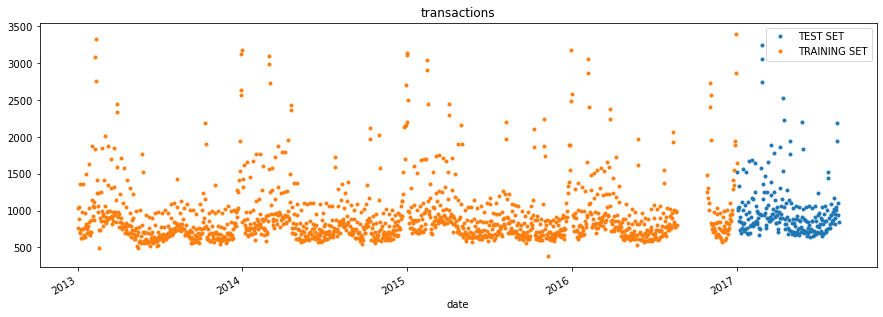

In [20]:
_ = transactions_test \
    .rename(columns={'transactions': 'TEST SET'}) \
    .join(transactions_train.rename(columns={'transactions': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='transactions', style='.')

##### Создадим временные признаки

In [21]:
def create_features(df, label=None):
    """
    создаем признаки из datetime индекса
    """
    df['date'] = df.index
    df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['hour','dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X

In [22]:
X_train, y_train = create_features(transactions_train, label='transactions')
X_test, y_test = create_features(transactions_test, label='transactions')

<ipython-input-21-da38acf4635d>:13: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.



##### Инициализируем и обучим модели XGBoost и CatBoost

In [23]:
import xgboost as xgb
from xgboost import plot_importance, plot_tree
from sklearn.metrics import mean_squared_error, mean_absolute_error
from catboost import CatBoostRegressor

In [24]:
#XGBoost
reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

C:\ProgramData\Anaconda3\lib\site-packages\xgboost\sklearn.py:793: UserWarning:

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=1000,
             n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
             reg_alpha=0, reg_lambda=1, ...)

In [25]:
# CatBoost
cbr = CatBoostRegressor(n_estimators=1000)
cbr.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

##### Посмотрим на важность призанаков

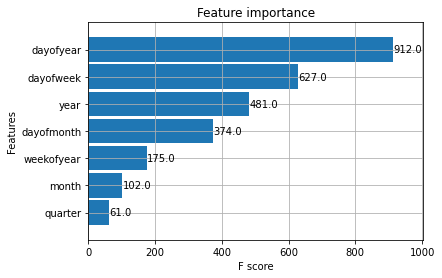

In [26]:
_ = plot_importance(reg, height=0.9)

Мы видим, что день года чаще всего использовался для разделения деревьев, а затем следуют день недели и год. Квартал имеет невысокую важность в связи с тем, что он мог быть создан разным разбиением по дням и годам.

##### Сделаем прогноз и посмотрим на полученные результаты

In [27]:
transactions_test['transactions_Prediction_gbr'] = reg.predict(X_test)
transactions_test['transactions_Prediction_catboost'] = cbr.predict(X_test)
transactions_all = pd.concat([transactions_test, transactions_train], sort=False)

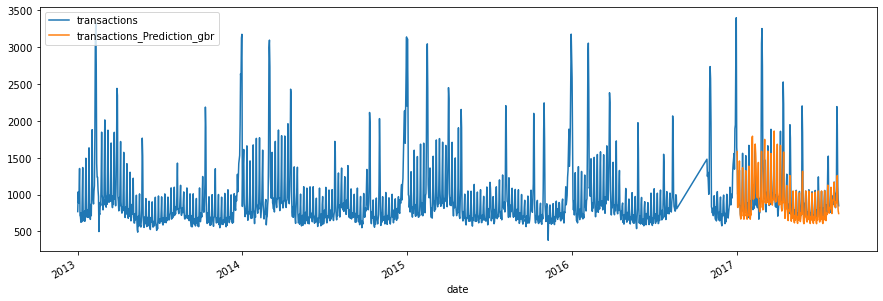

In [28]:
_ = transactions_all[['transactions','transactions_Prediction_gbr']].plot(figsize=(15, 5))

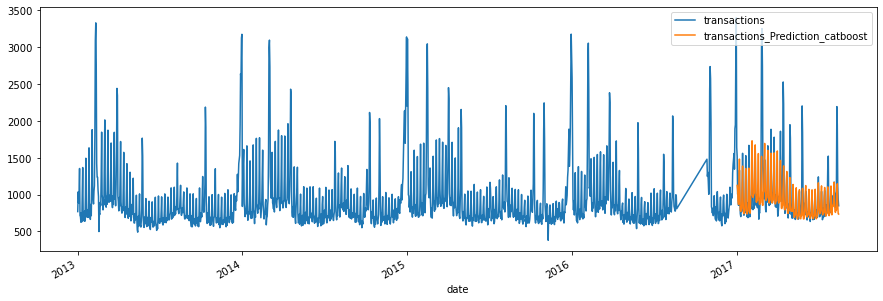

In [29]:
_ = transactions_all[['transactions','transactions_Prediction_catboost']].plot(figsize=(15, 5))

##### Расчитаем метрики MAE, MAPE, MSE по результатам двух моделей.

In [30]:
# Функция для расчета MAPE
def mean_absolute_percentage_error(y_true, y_pred): 
    """считаем MAPE по y_true и y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [31]:
MSE_gbr = mean_squared_error(y_true=transactions_test['transactions'],
                   y_pred=transactions_test['transactions_Prediction_gbr'])
MSE_catboost = mean_squared_error(y_true=transactions_test['transactions'],
                   y_pred=transactions_test['transactions_Prediction_catboost'])
print('MSE_gbr: %f' % MSE_gbr, 'MSE_catboost: %f' % MSE_catboost)

MAE_gbr = mean_absolute_error(y_true=transactions_test['transactions'],
                   y_pred=transactions_test['transactions_Prediction_gbr'])
MAE_catboost = mean_absolute_error(y_true=transactions_test['transactions'],
                   y_pred=transactions_test['transactions_Prediction_catboost'])
print('MAE_gbr: %f' % MAE_gbr, 'MAE_catboost: %f' % MAE_catboost)

MAPE_gbr = mean_absolute_percentage_error(y_true=transactions_test['transactions'],
                   y_pred=transactions_test['transactions_Prediction_gbr'])
MAPE_catboost = mean_absolute_percentage_error(y_true=transactions_test['transactions'],
                   y_pred=transactions_test['transactions_Prediction_catboost'])
print('MAPE_gbr: %f' % MAPE_gbr, 'MAPE_catboost: %f' % MAPE_catboost)

MSE_gbr: 102304.010909 MSE_catboost: 106855.905717
MAE_gbr: 159.028484 MAE_catboost: 157.078262
MAPE_gbr: 12.847669 MAPE_catboost: 12.314122


На моделях с настройками по умолчанию незначительно лучше себя показывает CatBoost c MAPE 12.314122 к MAPE_gbr: 12.847669 у XGBoost.

##### Добавим праздничные дни к нашим моделям.

In [32]:
transactions = df_transactions[df_transactions.store_nbr == 25]
transactions.drop(['store_nbr'], axis = 1, inplace = True)
transactions = pd.DataFrame(transactions).reset_index(drop=True)
transactions = transactions.set_index(pd.DatetimeIndex(transactions['date']))
transactions.drop(['date'], axis = 1, inplace = True)
transactions

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,transactions
date,
2013-01-01,770
2013-01-02,1038
2013-01-03,887
2013-01-04,1054
2013-01-05,1355
...,...
2017-08-11,2195
2017-08-12,1946
2017-08-13,1107


In [33]:
holidays = df_holidays_events[df_holidays_events['transferred'] == False][['description', 'date']]
holidays.columns = ['holiday', 'date']
holidays = holidays.set_index(pd.DatetimeIndex(holidays['date']))
holidays.drop(['date'], axis = 1, inplace = True)
holidays

,holiday
date,
2012-03-02,Fundacion de Manta
2012-04-01,Provincializacion de Cotopaxi
2012-04-12,Fundacion de Cuenca
2012-04-14,Cantonizacion de Libertad
2012-04-21,Cantonizacion de Riobamba
...,...
2017-12-22,Navidad-3
2017-12-23,Navidad-2
2017-12-24,Navidad-1


In [34]:
transactions = transactions.join(holidays)
transactions.head()

,transactions,holiday
date,,
2013-01-01,770,Primer dia del ano
2013-01-02,1038,NaN
2013-01-03,887,NaN
2013-01-04,1054,NaN
2013-01-05,1355,Recupero puente Navidad


In [35]:
# Проведем LabelEncoding для прадничных дней
from sklearn import preprocessing
encoder = preprocessing.LabelEncoder()
transactions['holiday'] = encoder.fit_transform(transactions['holiday'])

In [36]:
split_date = '01-Jan-2017'
transactions_train = transactions.loc[transactions.index <= split_date].copy()
transactions_test = transactions.loc[transactions.index > split_date].copy()

In [37]:
def create_features(df, label=None):
    """
    создаем признаки из datetime индекса
    """
    df['date'] = df.index
    df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['hour','dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear', 'holiday']]
    if label:
        y = df[label]
        return X, y
    return X

In [38]:
X_train, y_train = create_features(transactions_train, label='transactions')
X_test, y_test = create_features(transactions_test, label='transactions')

<ipython-input-37-bafff77a1f5d>:13: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.



In [39]:
#XGBoost
reg = xgb.XGBRegressor(n_estimators=1000, random_state = RANDOM_SEED) # Зафиксируем значения модели
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

C:\ProgramData\Anaconda3\lib\site-packages\xgboost\sklearn.py:793: UserWarning:

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=1000,
             n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=42,
             reg_alpha=0, reg_lambda=1, ...)

In [40]:
# CatBoost
cbr = CatBoostRegressor(n_estimators=1000, random_state = RANDOM_SEED)
cbr.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

In [41]:
transactions_test['transactions_Prediction_gbr'] = reg.predict(X_test)
transactions_test['transactions_Prediction_catboost'] = cbr.predict(X_test)
transactions_all = pd.concat([transactions_test, transactions_train], sort=False)

In [42]:
# Расчитаем метрики на моедлях с праздничными днями
MSE_gbr = mean_squared_error(y_true=transactions_test['transactions'],
                   y_pred=transactions_test['transactions_Prediction_gbr'])
MSE_catboost = mean_squared_error(y_true=transactions_test['transactions'],
                   y_pred=transactions_test['transactions_Prediction_catboost'])
print('MSE_gbr: %f' % MSE_gbr, 'MSE_catboost: %f' % MSE_catboost)

MAE_gbr = mean_absolute_error(y_true=transactions_test['transactions'],
                   y_pred=transactions_test['transactions_Prediction_gbr'])
MAE_catboost = mean_absolute_error(y_true=transactions_test['transactions'],
                   y_pred=transactions_test['transactions_Prediction_catboost'])
print('MAE_gbr: %f' % MAE_gbr, 'MAE_catboost: %f' % MAE_catboost)

MAPE_gbr = mean_absolute_percentage_error(y_true=transactions_test['transactions'],
                   y_pred=transactions_test['transactions_Prediction_gbr'])
MAPE_catboost = mean_absolute_percentage_error(y_true=transactions_test['transactions'],
                   y_pred=transactions_test['transactions_Prediction_catboost'])
print('MAPE_gbr: %f' % MAPE_gbr, 'MAPE_catboost: %f' % MAPE_catboost)

MSE_gbr: 77737.296651 MSE_catboost: 80995.558734
MAE_gbr: 147.919101 MAE_catboost: 141.530508
MAPE_gbr: 12.216726 MAPE_catboost: 11.283917


##### Вывод

Добавление к данным праздничных дней значитаельно улучшило качество работы модели. Лучшии метрики при обучении на стандартных параметрах показывает CatBoost.